# Synthèse et édition d'images de visage par réseaux génératifs

Letzelter Victor et Herpin Loïc

Sujet :
> La synthèse d'images a ces dernières années connus des progrès spectaculaires grâce à des approches par réseaux profonds génératifs. En particulier, un réseau adversarial génératif (GAN) particulièrement efficace a été proposé dans ce papier,[1] puis amélioré dans celui-ci [2] pour la synthèse de visages. Cette architecture permet la représentation des visages dans un espace dit espace latent. Le but du projet est d'explorer les possibilités d'édition offertes par cet espace latent, par exemple en s'inspirant de l'approche proposée dans ce papier [3].

Bibliographie :

[1] Karras, Tero, Samuli Laine, and Timo Aila. "A style-based generator architecture for generative adversarial networks." arXiv preprint arXiv:1812.04948 (2018).

[2] Karras, Tero, et al. "Analyzing and improving the image quality of stylegan." Proceedings of the IEEE/CVF Conference on Computer Vision and Pattern Recognition. 2020.

[3] Shen, Yujun, et al. "Interfacegan: Interpreting the disentangled face representation learned by gans." IEEE transactions on pattern analysis and machine intelligence (2020).

[4] Goodfellow, Ian, et al. "Generative adversarial nets." Advances in neural information processing systems 27 (2014).

[5] Zhu, Jiapeng, et al. "In-domain gan inversion for real image editing." European conference on computer vision. Springer, Cham, 2020.

[6] Xia, Weihao, et al. "GAN inversion: A survey." arXiv preprint arXiv:2101.05278 (2021).

[7] Borji, Ali. "Pros and cons of GAN evaluation measures: New developments." Computer Vision and Image Understanding 215 (2022): 103329.

[8] Zhu, Jun-Yan, et al. "Generative visual manipulation on the natural image manifold." European conference on computer vision. Springer, Cham, 2016.

[9] Härkönen, Erik, et al. "Ganspace: Discovering interpretable gan controls." Advances in Neural Information Processing Systems 33 (2020): 9841-9850.

Repo utilisés :

[*] https://github.com/genforce/interfacegan

[*] https://github.com/NVlabs/stylegan2-ada-pytorch

[*] https://github.com/genforce/idinvert.git

***

## Initialisation du notebook

> Imports

In [ ]:
### Modèles pré-entraînés et Gits utiles ###

### InterfaceGAN

import os
os.chdir('/content')
CODE_DIR = 'interfacegan'
!git clone https://github.com/genforce/interfacegan.git $CODE_DIR
os.chdir(f'./{CODE_DIR}')
!wget https://www.dropbox.com/s/t74z87pk3cf8ny7/pggan_celebahq.pth?dl=1 -O models/pretrain/pggan_celebahq.pth --quiet
!wget https://www.dropbox.com/s/nmo2g3u0qt7x70m/stylegan_celebahq.pth?dl=1 -O models/pretrain/stylegan_celebahq.pth --quiet
!wget https://www.dropbox.com/s/qyv37eaobnow7fu/stylegan_ffhq.pth?dl=1 -O models/pretrain/stylegan_ffhq.pth --quiet
os.chdir('/content')

### StyleGAN

CODE_DIR2 = 'stylegan'
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch.git $CODE_DIR2

os.chdir(f'./{CODE_DIR2}')
os.mkdir('models')
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl -O models/ffhq.pkl --quiet
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metfaces.pkl -O models/metfaces.pkl --quiet
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqcat.pkl -O models/afhqcat.pkl --quiet
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqdog.pkl -O models/afhqdog.pkl --quiet
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/afhqwild.pkl -O models/afhqwild.pkl --quiet
os.chdir('/content')

os.mkdir('experiences')
os.mkdir('data')

Cloning into 'interfacegan'...
remote: Enumerating objects: 613, done.
remote: Counting objects: 100% (366/366), done.
remote: Compressing objects: 100% (312/312), done.
remote: Total 613 (delta 104), reused 303 (delta 54), pack-reused 247
Receiving objects: 100% (613/613), 13.74 MiB | 15.70 MiB/s, done.
Resolving deltas: 100% (189/189), done.
Cloning into 'stylegan'...
remote: Enumerating objects: 128, done.
remote: Total 128 (delta 0), reused 0 (delta 0), pack-reused 128
Receiving objects: 100% (128/128), 1.12 MiB | 20.50 MiB/s, done.
Resolving deltas: 100% (57/57), done.


In [ ]:
### Imports

import os.path
import io
import IPython.display
import numpy as np
import cv2
import PIL.Image
import pickle
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

import torch

%pip install ninja
import ninja

os.chdir(f'./{CODE_DIR}')
from models.model_settings import MODEL_POOL
from models.pggan_generator import PGGANGenerator
from models.stylegan_generator import StyleGANGenerator
from utils.manipulator import linear_interpolate
os.chdir('/content')

     |████████████████████████████████| 108 kB 15.1 MB/s 


# Présentation du sujet

Sommaire :

* 1\. La synthèse d'image par réseau profond génératif

    * 1.1 Réseau Adversarial Génératif (GAN)

    * 1.2 StyleGAN
        * Présentation
        * StyleGAN 2

* 2\. Inversion d'une image réelle
    
    * 2.1 Etat de l'art en inversion de GANs
    * 2.2 Importation de fonctions utiles pour l'inversion
    * 2.3 Expériences réalisées sur les images réelles
      * Impact de l'initialisation
      * Manipulation sémantique d'images réelles
    * 2.4 Références utilisée dans cette partie 

* 3\. Manipulation d'image

    * 3.1 InterFaceGAN
    * 3.2 Analyse en Composantes Principales (PCA)

# 1\. La synthèse d'image par réseau profond génératif

#### 1.1 Réseau Adversarial Génératif (GAN)
Les GANs designent une classe de réseau génératif d'images fonctionnant de manière non supervisée introduits par Goodfellow et al. en 2014$^{[4]}$. Leur design consiste en l'opposition de deux réseaux : le générateur $G$ et le discriminateur $D$. Le premier apprend à mapper un espace latent ($\mathcal{Z} \subseteq \mathbb{R}^d$) à une distribution ($\mathcal{X}$), le second cherche à discriminer la distribution réelle et les données générées. L'entraînement de $G$ et $D$ et réalisé via l'optimisation *Two-players minmax game*

$$
\min _{G} \max _{D} V(D, G)
=\mathbb{E}_{\mathbf{x} \sim p_{\text {data }}(\mathbf{x})}[\log D(\mathbf{x})]+\mathbb{E}_{\mathbf{z} \sim p_{\mathbf{z}}(\mathbf{z})}[\log (1-D(G(\mathbf{z})))]
$$

où $p_{\text {data}}$ et $p_{\mathbf{z}}$ correspondent respectivement à la distribution et donnée réelles et des données simulées. 

Une architecture usuelle pour le générateur consiste à partir d'un vecteur $z \sim \mathcal{N}(0,I_d)$ et de le transmettre au travers d'un réseau déconvolutif (pour créer une image de taille 4x4, 8x8, etc.).

#### 1.2 StyleGAN

Le modèle utilisé dans notre travail est celui introduit par Karras et al.[1] en 2018 : StyleGAN.

Ce modèle dévie des GANs habituels de par le contrôle sur l'output qu'il apporte. Usuellement, le générateur a pour architecture un réseau déconvolutif (fig. 1a) : un vecteur $\mathbf{z} \in \mathcal{Z}$ passe à travers un mapping $G : \mathcal{Z} \to \mathcal{X}$.

L'architecture de StyleGAN décompose ce mapping en deux mapping $G_1 : \mathcal{Z} \to \mathcal{W}$ et $G_2 : \mathcal{W} \to \mathcal{X}$. En introduisant un espace intermédiaire $\mathcal{W}$, StyleGAN permet ainsi l'accès à un espace qui est plus désenchevêtré que l'espace latent initial $\mathcal{Z}$, et en conséquence un contrôle plus fin des attributs de l'image de sortie.

De plus, l'architecture de StyleGAN diffère aussi de par la façon dont le vecteur $\mathbf{w} \in \mathcal{W}$ est transmis au réseau déconvolutif (fig. 1b). Le vecteur $\mathbf{w}$ est ainsi transmis indépendemment à chaque étape de déconvolution du générateur au travers de l'opération AdaIN (adaptive instance normalization) définie par :

$$
\text{AdaIN}(x_i,y) = y_{s,i}\frac{x_i - \mu(x_i)}{\sigma(x_i)} + y_{b,i}
$$

Où $x_i$ sont les features maps et y = ($y_s$, $y_b$) sont obtenus par une transformation affine sur $\mathbf{w}$

Cette manière de transmettre indépendemment à chacunes des 18 étapes de déconvolution $\mathbf{w}$ permet alors de pouvoir fournir des vecteurs $\mathbf{w}$ différents pour chaque étape. Il faut noter par ailleurs que chaque étape contrôle un degré différent de détail : les premiers niveaux impacteront des caractéristiques plus grossières (genre, pose, etc.) et les derniers niveaux impacteront des caractéristiques plus fines (couleur de cheveux, tâches de rousseur, etc.). Ainsi une des innovations apportée par StyleGAN est le transfert de style d'une image à une autre. Au cours de la construction de l'image du générateur, on peut ainsi fournir pour les dernières étapes de déconvolution le vecteur $\mathbf{w}_{2}$ de la seconde image au lieu du vecteur $\mathbf{w}_{1}$ de la première et ainsi récupérer ses caractéristiques fines.

<center> <img src='https://drive.google.com/uc?export=view&id=1Sf3eZBtDOGjyhTloNIKlcWg8Co2xOh56' width="500">

Figure 1: Extrait de l'article par Karras et al.[1]

Setting up PyTorch plugin "bias_act_plugin"... Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... Done.


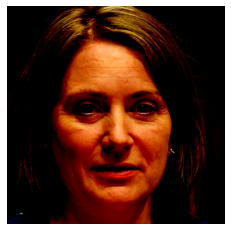

In [ ]:
#@title Exemple de génération d'image avec StyleGAN 2

os.chdir(f'./{CODE_DIR2}')
with open('models/ffhq.pkl', 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda() 
c = None

# Génération d'un vecteur aléatoire z
z = torch.randn([1, G.z_dim]).cuda()

# Mapping de ce vecteur dans l'espace W
w = G.mapping(z, c, truncation_psi=0.5, truncation_cutoff=8)

# Synthèse de l'image
img = G.synthesis(w, noise_mode='const', force_fp32=True)
plt.imshow(np.clip(img.cpu().permute(2, 3, 1, 0).squeeze(),0,1))
plt.axis('off')
os.chdir('/content')

# 2\. Inversion d'une image réelle

### 2.1 \. Etat de l'art en inversion de GANs

La performance des GANs pour la génération d'images synthétiques étant bien reconnue, le domaine de recherche de la manipulation d'images réelle avec les GANs, connu sous le nom d'inversion de GANs, a émergé au cours des dernières années. Cette inversion de GANs est motivée, entre autres, par la possibilité d'effectuer des manipulations réelles d'images en agissant sur l'espace latent sur lequel le Gerarateur $G$ est défini. 

L'objectif de cette section est de décrire formellement l'état de l'art des méthodes d'inversion de GANs, et d'explorer les possibilités qu'elle offre en matière de manipulation d'images et de modification d'attributs dans le domaine de la génération de visages.

**Description formelle du problème**

Considérons un GAN composé d'un générateur $G : \mathcal{Z} \rightarrow \mathcal{X}$ et d'un discriminateur $D : \mathcal{X} \rightarrow [0,1]$. Le but du problème d'inversion du GAN est, étant donné une image réelle $\mathbf{x} \in \mathcal{X}$, de retrouver un code latent $\mathbf{z} \in \mathcal{Z}$ tel que $G(\mathbf{z})=\mathbf{x}$. En pratique, on cherchera $\tilde{\mathbf{z}}$ telle que la distance $d$ entre $G(\tilde{\mathbf{z}})$ et $\mathbf{x}$ soit la plus petite possible. Le problème d'optimisation peut donc s'écrire comme suit 

\begin{equation}
\tag{1}
\mathbf{z^{*}} = \underset{\mathbf{z} \in \mathcal{Z}}{\mathrm{argmin}} \; d(G(\mathbf{z}),\mathbf{x})
\end{equation}

La métrique de distance $d$ peut être choisie pour être une distance perceptive, qui peut typiquement être mesurée en utilisant un CNN feed-forward pré-entraîné $F$ (par exemple VGG entraîné sur Image-Net, [5,6]), qui met en correspondance une image d'entrée avec une distribution de classes : 
$$d : \left\{\begin{array}{l}
\mathcal{X} \times \mathcal{X} \longrightarrow \mathbb{R}_{+} \\ 
 (\mathbf{x}, \mathbf{y}) \mapsto \|F(\mathbf{x})-F(\mathbf{y})\|_{2} \end{array}\right.$$

Il existe deux approches générales pour résoudre le problème d'optimisation (1) : l'approche basée sur l'optimisation (*Optimization based GAN inversion*) et l'approche basée sur l'entraînement d'un encoder (*Learning based approach*).

L'inversion GAN basée sur l'optimisation consiste à résoudre (1) en utilisant un générateur pré-entraîné avec des poids fixes $\theta$ :
$$\mathbf{z}^{*}=\underset{\mathbf{z} \in \mathcal{Z}}{\mathrm{argmin}} \;d(\mathbf{x}, G_{\theta}(\mathbf{z}))$$
Dans ce cas, les méthodes de descente de gradient peuvent être appliquées, étant donné le code latent initial $\mathbf{z}_{0}$ comme point de départ. Comme (1) n'est généralement pas convexe, le point de départ a une grande importance et un mauvais choix peut bloquer l'optimiseur (par exemple Adam, SGD) dans un minima local. Une approche possible pour traiter ce type de problème, proposée dans [1], est s'intitulant *truncation trick* 
consistant à calculer le centre de masse dans l'espace latent considéré (par exemple dans $\mathcal{W}$: $\overline{\mathbf{w}}=\mathbb{E}_{\mathbf{z} \sim P(\mathbf{z})}[f(\mathbf{z})]$, par MC sampling par exemple), puis, pour un $\mathbf{w}$ échantilonné dans l'espace $\mathcal{W}$, appliquer la transformation: 
$$\tau_{\psi}: \mathbf{w} \mapsto 
\overline{\mathbf{w}}+\psi(\mathbf{w}-\overline{\mathbf{w}})
$$
où $\psi \in [-1,1]$.

L'approche **basée sur l'apprentissage** consiste à entraîner un encodeur $E$ pour mapper un code latent $\mathbf{z} \in \mathcal{Z}$ étant donné une image $\mathbf{x}$. Si l'on considère un ensemble de $N$ exemples $\{(\mathbf{x}_{n}, \mathbf{z}_{n})\}_{n \in [\![1,N]\!]}$, les paramètres du réseau de l'encodeur peuvent être ajustés en résolvant le problème d'optimisation suivant :

\begin{equation}
\tag{2}
\theta_{E}^{*}=\underset{\theta_{E}}{\arg \min } \sum_{n} \ell \left(G\left(E_{\theta_{E}}\left(\mathbf{x}_{n}\right)\right), \mathbf{x}_{n}\right)
\end{equation}
Où $\ell$ est une fonction de perte appropriée. Cette formulation a été proposée par Zhu et al. [5] comme une alternative à la reconstruction dans l'espace $\mathcal{Z}$ :
\begin{equation}
\tag{3}
\theta_{E}^{*}=\underset{\theta_{E}}{\arg \min } \sum_{n} \ell'\left(E_{\theta_{E}}\left(\mathbf{x}_{n}\right), \mathbf{z}_{n}\right)
\end{equation}
car (3) omet le $G$ dans le processus d'optimisation et donc la connaissance du domaine du générateur. Une fois entraînée, l'approche basée sur l'apprentissage est donc déterministe puisque $E$ devient une fonction déterministe. 

La méthode basée sur l'optimisation permet généralement d'obtenir une meilleure reconstruction de la sémantique du visage par rapport aux méthodes basées sur l'encodage pour un code latent initial bien choisi $\mathbf{z}_{0} \in \mathcal{Z}$ mais la méthode basée sur l'encodeur est plus rapide à réaliser [3,6]. 
C'est pourquoi des méthodes hybrides ont été proposées, afin de tirer profit à la fois des méthodes basées sur l'optimisation et sur l'apprentissage. L'idée initiale de ces méthodes *hybrides*, proposée par Zhu et al. dans [8], consiste à utiliser à la fois l'encodeur $E_{\theta_{E}}$ et l'optimiseur à code latent de telle sorte que, pour une image d'entrée $\mathbf{x}$, le point $\mathbf{z}_{0}=E_{\theta_{E}}(\mathbf{x})$ est choisi comme point de départ de l'optimisation. 

De façon plus spécifique la méthode hybride proposée par Zhu et al. dans [5] - *In-domain-GAN* repose sur le processus d'optimisation suivant:

D'une part, l'encoder est optisée en résolvant le problème d'optimisation suivant:
Tout d'abord, l'encoder est entraîné de façon supervisé en se basant sur les exemples d'entraînement sous la forme $\{ (\mathbf{x}_{i},\mathbf{w}_{n})\}_{n \in [\![1,N]\!]} \in (\mathcal{X} \times \mathcal{Z})^{N}$
$$
\theta_{E} =  \underset{\theta_{E}}{\mathrm{argmin}} \sum_{n} \lambda_{1} \underbrace{\left\|E_{\theta_{E}}(\mathbf{x}_{n})-\mathbf{w}_{n} \right\|_{2}}_{\text {latent loss }}+\lambda_{2} \underbrace{\left\|G(E_{\theta_{E}}(\mathbf{x}_{n}))-\mathbf{x}_{n}\right\|_{2}}_{\text {image reconstruction loss }}+\lambda_{3} \underbrace{d\left(G(E_{\theta_{E}}(\mathbf{x}_{n})), \mathbf{x}_{n}\right)}_{\text {perceptual feature loss }}
$$

où $\lambda_{1},\lambda_{2},\lambda_{3} \in \mathbb{R}_{+}$ ont été déterminés dans [5], $G:=G_{\theta_{G}} : \mathcal{Z} \rightarrow \mathcal{X}$ est préentrainé et fixe, et $d$ est une distance perceptuelle calculée en utilisant, par exemple, un VGG noté $F$ (voir plus haut), et $E_{\theta_{E}} : \mathcal{X} \rightarrow \mathcal{Z}$.

Par la suite, le problème d'optisation dans l'espace latent $\mathcal{Z}$ pour $\mathbf{x} \in \mathcal{X}$ donné est: 

$$ \mathbf{w}^{*} = \underset{\mathbf{w}}{\mathrm{argmin}}\; \|G(\mathbf{w})-\mathbf{x}\|_{2}+\alpha d(G(\mathbf{w}), \mathbf{x})+\beta
\|\mathbf{w}-E(G(\mathbf{w}))\|_{2}
$$

où $\alpha >0$ est un paramètre ajustable. 

Dans le cadre de StyleGAN, le générateur est composé de deux réseaux de feed-forward, le réseau de mapping $G_{1} : \mathcal{Z} \rightarrow \mathcal{W}$, et le réseau de synthèse $G_{2} : \mathcal{W} \rightarrow \mathcal{X}$ tel que : $G = G_{2} \circ G_{1}$. Il a été démontré par des études de désenchevêtrement [1,2,3] que l'espace latent $\mathcal{W}$ est plus adapté pour manipuler les attributs des images générées de manière indépendante, i.e : les frontières séparant les attribus sont modélisables par des hyperplans avec une bonne approximation. Pour ce faire, des métriques ont été conçues à partir de la mesure du désenchevêtrement (notamment Perceptual Path Length et Linear Separability, voir [1,7]).  

Dans ce contexte, le problème d'optimisation peut être reformulé comme suit 

$$\mathbf{w^{*}} = \underset{\mathbf{w} \in \mathcal{W}}{\mathrm{argmin}} \; d(G_{2}(\mathbf{w}),\mathbf{x})$$

Typiquement, les réseaux StyleGAN peuvent être conçus de telle sorte que $\mathrm{dim}(\mathcal{X})=256 \times 256$ et $\mathrm{dim}(\mathcal{W})=\mathrm{dim}(\mathcal{Z})=512$ (Architecture utilisée dans l'expérience). Comme l'échantillonnage direct à partir de $\mathcal{W}$ ou $\mathcal{Z}$ peut être délicat [6] en raison de la différence de dimensions, une alternative consiste à considérer un autre espace latent, appelé $\mathcal{W}^{+}$, de dimension $\mathrm{dim}(\mathcal{Z})=512 \times N_{layers}$, où $N_{layers}$ est le nombre de couches du réseau de synthèse $G_{2}$. Dans ce cadre, pour $\mathbf{w}^{+} \in \mathbb{R}^{512 \times N_{layers}}$ vu comme une matrice, chaque colonne $\mathbf{w}^{+}_{.,j}$ correspond à un vecteur alimentant le bloc de style convolutionnel numéro $\lfloor \frac{j+1}{2} \rfloor$ de StyleGAN via l'AdaIN (Adaptive Instance Normalisation) ; le réseau $G_{2}$ possède deux AdaIN par bloc. 

Une fois le code latent $\mathbf{w}^{+}$ d'une image $\mathbf{x}$ a été obtenu, la modification d'une image dans la direction d'un attribut associé à un hyperplan de vecteur normal $\mathbf{n} \in \mathcal{W}^{+}$ est réalisé en calculant, 
$\{ G_{2}(\mathbf{w}^{+}+\lambda \mathbf{n}$), $\lambda \in [\![-a,a]\!]$ \}, où $a \in \mathbb{N}$ permet de fixer la distance à laquelle on s'eloigne de la frontière associée à l'attribut correspondant. 

### 2.2 \. Importation du code

ID GAN inversion Git : https://github.com/Victorletzelter/idinvert_pytorch.git

In [ ]:
!git clone https://github.com/Victorletzelter/idinvert_pytorch.git

Cloning into 'idinvert_pytorch'...
remote: Enumerating objects: 108, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 108 (delta 7), reused 13 (delta 6), pack-reused 89
Receiving objects: 100% (108/108), 8.33 MiB | 23.64 MiB/s, done.
Resolving deltas: 100% (24/24), done.


In [ ]:
cd /content/idinvert_pytorch

/content/idinvert_pytorch


In [ ]:
from idinvert_pytorch.utils.inverter import StyleGANInverter
from idinvert_pytorch.utils.logger import setup_logger
from idinvert_pytorch.utils.visualizer import HtmlPageVisualizer
from idinvert_pytorch.utils.visualizer import save_image, load_image, resize_image

import os.path
import argparse
import numpy as np
from tqdm import tqdm
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import torch

from idinvert_pytorch.models.helper import build_generator
from idinvert_pytorch.utils.logger import setup_logger
from idinvert_pytorch.utils.editor import manipulate
from idinvert_pytorch.utils.visualizer import load_image
from idinvert_pytorch.utils.visualizer import HtmlPageVisualizer

In [ ]:
!unzip /content/idinvert_pytorch/test_images/Images.zip -d /content/idinvert_pytorch/test_images

Archive:  /content/idinvert_pytorch/test_images/Images.zip
  inflating: /content/idinvert_pytorch/test_images/Loic.png  
  inflating: /content/idinvert_pytorch/test_images/__MACOSX/._Loic.png  
  inflating: /content/idinvert_pytorch/test_images/Victor.png  
  inflating: /content/idinvert_pytorch/test_images/__MACOSX/._Victor.png  


In [ ]:
import os

if not os.path.exists('/content/idinvert_pytorch/models/pretrain'):
 os.makedirs('/content/idinvert_pytorch/models/pretrain')

In [ ]:
!wget https://www.dropbox.com/s/pcjmp6av24ic2h3/styleganinv_ffhq256_encoder.pth?dl=0 -O models/pretrain/styleganinv_ffhq256_encoder.pth --quiet
!wget https://www.dropbox.com/s/ispou5p2bvq4ilp/styleganinv_ffhq256_generator.pth?dl=0 -O models/pretrain/styleganinv_ffhq256_generator.pth --quiet
!wget https://www.dropbox.com/s/nez0dtunr4uz3do/vgg16.pth?dl=0 -O models/pretrain/vgg16.pth --quiet

In [ ]:
def _get_tensor_value(tensor):
  """Gets the value of a torch Tensor."""
  return tensor.cpu().detach().numpy()

In [ ]:
#Useful functions extracted from the git
def parse_indices(obj, min_val=None, max_val=None):
  """Parses indices.
  If the input is a list or tuple, this function has no effect.
  The input can also be a string, which is either a comma separated list of
  numbers 'a, b, c', or a dash separated range 'a - c'. Space in the string will
  be ignored.
  Args:
    obj: The input object to parse indices from.
    min_val: If not `None`, this function will check that all indices are equal
      to or larger than this value. (default: None)
    max_val: If not `None`, this function will check that all indices are equal
      to or smaller than this field. (default: None)
  Returns:
    A list of integers.
  Raises:
    If the input is invalid, i.e., neither a list or tuple, nor a string.
  """
  if obj is None or obj == '':
    indices = []
  elif isinstance(obj, int):
    indices = [obj]
  elif isinstance(obj, (list, tuple, np.ndarray)):
    indices = list(obj)
  elif isinstance(obj, str):
    indices = []
    splits = obj.replace(' ', '').split(',')
    for split in splits:
      numbers = list(map(int, split.split('-')))
      if len(numbers) == 1:
        indices.append(numbers[0])
      elif len(numbers) == 2:
        indices.extend(list(range(numbers[0], numbers[1] + 1)))
  else:
    raise ValueError(f'Invalid type of input: {type(obj)}!')

  assert isinstance(indices, list)
  indices = sorted(list(set(indices)))
  for idx in indices:
    assert isinstance(idx, int)
    if min_val is not None:
      assert idx >= min_val, f'{idx} is smaller than min val `{min_val}`!'
    if max_val is not None:
      assert idx <= max_val, f'{idx} is larger than max val `{max_val}`!'

  return indices

def get_layerwise_manipulation_strength(num_layers,
                                        truncation_psi,
                                        truncation_layers):
  """Gets layer-wise strength for manipulation.

  Recall the truncation trick played on layer [0, truncation_layers):

  w = truncation_psi * w + (1 - truncation_psi) * w_avg

  So, when using the same boundary to manipulate different layers, layer
  [0, truncation_layers) and layer [truncation_layers, num_layers) should use
  different strength to eliminate the effect from the truncation trick. More
  concretely, the strength for layer [0, truncation_layers) is set as
  `truncation_psi`, while that for other layers are set as 1.
  """
  strength = [1.0 for _ in range(num_layers)]
  if truncation_layers > 0:
    for layer_idx in range(0, truncation_layers):
      strength[layer_idx] = truncation_psi
  return strength

### 2.3 Expériences réalisées sur des images réelles

*Les expériences qui suivent ont été réalisé à partir d'un StyleGAN - 256x256 entraîné sur le dataset FFHQ (Flicker Faces High Quality).*

Cette section consiste en une étude qualitative des performances de différents GANs inverters et dans différentes configurations. 

Considérons l'image suivante, qu'il s'agira d'inverser puis de manipuler.

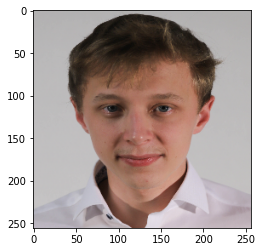

In [ ]:
image=np.array(Image.open('/content/idinvert_pytorch/test_images/Victor.png'))[:,:,0:3]
image_resized = cv2.resize(image, (256, 256)) #On reshape l'image pour s'adapter à l'architecture utilisée. 
plt.imshow(image_resized)

Réalisons les réglages du modèle qui sera utilisé dans toute la suite.

In [ ]:
model_name='styleganinv_ffhq256'
learning_rate=0.01
num_iterations=300
aloss_weight_feat=5e-5
loss_weight_enc=2.0
output_dir=f'results/inversion/essai'
logger=setup_logger(output_dir, 'inversion.log', 'inversion_logger')

In [ ]:
inverter = StyleGANInverter(model_name,
      learning_rate=learning_rate,
      iteration=num_iterations,
      reconstruction_loss_weight=1.0,
      perceptual_loss_weight=aloss_weight_feat,
      regularization_loss_weight=loss_weight_enc,
      logger=logger)

[2022-02-15 18:13:38,963][INFO] Build network for module `generator` in model `styleganinv_ffhq256`.
[2022-02-15 18:13:39,218][INFO] Loading pytorch weights from `models/pretrain/styleganinv_ffhq256_generator.pth`.
[2022-02-15 18:13:39,493][INFO] Successfully loaded!
[2022-02-15 18:13:39,547][INFO] Current `lod` is 0.0.
[2022-02-15 18:13:39,549][INFO] Build network for module `encoder` in model `styleganinv_ffhq256`.
[2022-02-15 18:13:40,835][INFO] Loading pytorch weights from `models/pretrain/styleganinv_ffhq256_encoder.pth`.
[2022-02-15 18:13:42,533][INFO] Successfully loaded!


### 2.3.1 Impact de l'initialisation

Considérons dans un premier temps l'inversion d'une image réelle dans $\mathcal{W}^{+}$, en utilisant une méthode *Optimisation based*, et étudions l'influence du point de départ $\mathbf{w}_{0}$ sur le résultat. 

*   Cas 0 (Naïf) : $\mathbf{w}_{0}$ est considéré comme la réalisation d'un bruit blanc gaussien: $\mathbf{w}_{0} \sim \mathcal{N}(0,I)$.
*   Cas 1 : On sample $\mathbf{z}_{0} \sim \mathcal{N}(0,I)$ puis $\mathbf{w}_{0}=f(\mathbf{z}_{0})$
*   Cas 2 :  On calcule: $\overline{\mathbf{w}}=\mathbb{E}_{\mathbf{z} \sim P(\mathbf{z})}[f(\mathbf{z})]$ puis étant donné $\mathbf{w} \sim f(\mathcal{N}(0,I))$, on choisit $\mathbf{w}_{0}=\tau_{\psi}(\mathbf{w})$.
*   Cas 3 (Optimal) : On choisit $\mathbf{w}_{0}=E_{\theta_{E}}(\mathbf{x})$ suivant la méthode proposée par Zhu et al. dans [1].


Commençons par réaliser des prétraitements sur l'image.

In [ ]:
preprocessed_image=inverter.preprocess(image)
x = preprocessed_image[np.newaxis]
x = inverter.G.to_tensor(x.astype(np.float32))

Définissons la fonction d'optimisation du code latent $\mathbf{w}$.

In [ ]:
def optim(init_w,x,inverter,N_iter) :
  """
  Fonction d'optimisation 
  Entrées : 
    - init_w : tableau numpy de taille (14,512)
    - x : image d'entrée ayant subi le préprocessing
    - inverter : object de type StyleGANInverter (voir code source)
    - N_iter : nombre d'opérations d'initialisation
  Sorties :
    - w : code latent optimisé
    - dict_losses : valeur des différentes Losses, sauvargardées lors de l'éxécution
  """
  w = torch.Tensor(init_w).to(inverter.run_device)
  w.requires_grad = True
  optimizer = torch.optim.Adam([w], lr=inverter.learning_rate)

  dict_losses={}
  dict_losses['loss_pix']=[]
  dict_losses['loss_feat']=[]
  dict_losses['loss_reg']=[]
  dict_losses['loss']=[]

  for i in range(N_iter) :

      if i%100==0 :
        print(i)
      loss = 0.0

      # # Reconstruction loss.
      x_rec = inverter.G.net.synthesis(w)
      loss_pix = torch.mean((x - x_rec) ** 2)
      loss = loss + loss_pix * inverter.loss_pix_weight
      dict_losses['loss_pix'].append(_get_tensor_value(loss_pix))

      # Perceptual loss.
      if inverter.loss_feat_weight:
        x_feat = inverter.F.net(x)
        x_rec_feat = inverter.F.net(x_rec)
        loss_feat = torch.mean((x_feat - x_rec_feat) ** 2)
        loss = loss + loss_feat * inverter.loss_feat_weight
        dict_losses['loss_feat'].append(_get_tensor_value(loss_feat))

      # Regularization loss.
      if inverter.loss_reg_weight:
        w_rec = inverter.E.net(x_rec).view(1, *inverter.encode_dim)
        loss_reg = torch.mean((w - w_rec) ** 2)
        loss = loss + loss_reg * inverter.loss_reg_weight
        dict_losses['loss_reg'].append(_get_tensor_value(loss_reg))

      dict_losses['loss'].append(_get_tensor_value(loss))

      # Do optimization.
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

  return w,dict_losses

Dans le cas optimal, les l'image obtenue après 300 itérations d'optimisation est la suivante. 

0
100
200


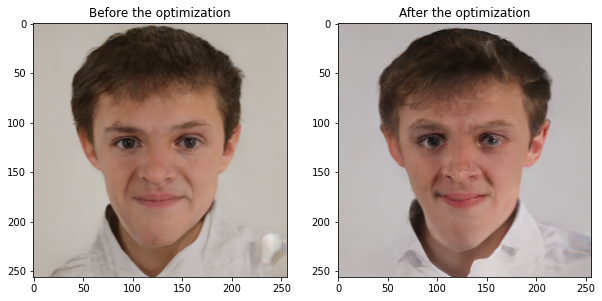

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(10,10))

init_w = inverter.E.net(x).view(1, *inverter.encode_dim) #De taille [1,inverter.num_layers, inverter.w_space_dim]
x_ini = inverter.G.net.synthesis(init_w.to(inverter.run_device))
gen_image=inverter.G.postprocess(_get_tensor_value(x_ini))[0]
ax[0].imshow(gen_image)
ax[0].set_title('Before the optimization')
init_w = _get_tensor_value(inverter.E.net(x).view(1, *inverter.encode_dim))
w,dict_losses3=optim(init_w,x,inverter,300)
x_rec = inverter.G.net.synthesis(w)
gen_image=inverter.G.postprocess(_get_tensor_value(x_rec))[0]
ax[1].imshow(gen_image)
ax[1].set_title('After the optimization')
plt.show()

Sauvegardons le code latent obtenu

In [ ]:
if not os.path.exists('/content/idinvert_pytorch/results/inversion/test'):
 os.makedirs('/content/idinvert_pytorch/results/inversion/test')

In [ ]:
output_dir='/content/idinvert_pytorch/results/inversion/test'
plt.imsave(f'{output_dir}/Victor_inv.png',gen_image)
np.save(f'{output_dir}/inverted_codes.npy',_get_tensor_value(w))

f = open("image_list.txt", "w")
f.write("/content/idinvert_pytorch/test_images/Victor.png")
f.close()

Dans le cas 0 (naïf), on note que l'image produite est bien moins rationnelle d'un point de vue sémantique. 

0
100
200


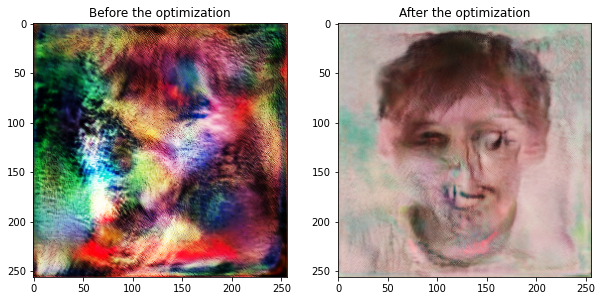

In [ ]:
init_w=torch.stack([torch.normal(mean=0, std=torch.ones(*inverter.encode_dim))],dim=0)

fig,ax=plt.subplots(1,2,figsize=(10,10))

x_ini = inverter.G.net.synthesis(init_w.to(inverter.run_device))
gen_image=inverter.G.postprocess(_get_tensor_value(x_ini))[0]
ax[0].imshow(gen_image)
ax[0].set_title('Before the optimization')
w,dict_losses0=optim(init_w,x,inverter,300)
x_rec = inverter.G.net.synthesis(w)
gen_image=inverter.G.postprocess(_get_tensor_value(x_rec))[0]
ax[1].imshow(gen_image)
ax[1].set_title('After the optimization')
plt.show()

Dans le cas 1 (ci-dessous), la reconstruction est de meilleure qualité, mais reste très dépendante de l'image de départ. 

0
100
200


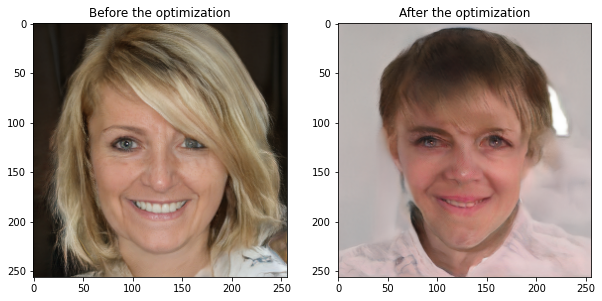

In [ ]:
N=1

z_samples=torch.normal(mean=0, std=torch.ones([N,512])).to(inverter.run_device)
w_samples = inverter.G.net.mapping.norm(z_samples)
for i in range(inverter.G.net.mapping.num_layers):
  w_samples = inverter.G.net.mapping.__getattr__(f'dense{i}')(w_samples)
mean_w = torch.stack([torch.mean(w_samples, dim=0).to(inverter.run_device)],dim=0).to('cpu') #Center of mass of the distribution
mean_w=torch.tensor(_get_tensor_value(mean_w).reshape(1,14,512))

init_w=mean_w

fig,ax=plt.subplots(1,2,figsize=(10,10))

before = inverter.G.net.synthesis(init_w.to(inverter.run_device))
gen_image=inverter.G.postprocess(_get_tensor_value(before))[0]
ax[0].imshow(gen_image)
ax[0].set_title('Before the optimization')

w,dict_losses1=optim(init_w,x,inverter,300)
x_rec = inverter.G.net.synthesis(w)
gen_image=inverter.G.postprocess(_get_tensor_value(x_rec))[0]

ax[1].imshow(gen_image)
ax[1].set_title('After the optimization')
plt.show()

Enfin, dans le troisième cas, l'image obtenue est relativement satisfaisante. La qualité de la reconstruction est classée seconde après celle du Cas optimal.

0
100
200


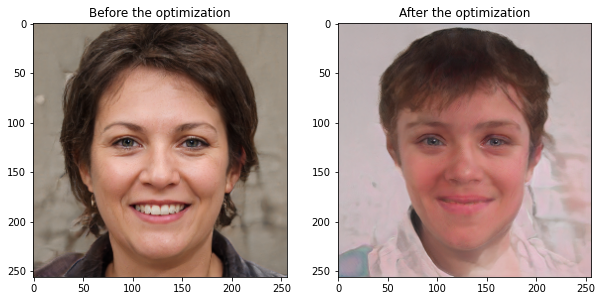

In [ ]:
N=10000
psi=0

z_samples=torch.normal(mean=0, std=torch.ones([N,512])).to(inverter.run_device)
w_samples = inverter.G.net.mapping.norm(z_samples)
for i in range(inverter.G.net.mapping.num_layers):
  w_samples = inverter.G.net.mapping.__getattr__(f'dense{i}')(w_samples)
mean_w = torch.stack([torch.mean(w_samples, dim=0).to(inverter.run_device)],dim=0).to('cpu') #Center of mass of the distribution
mean_w=torch.tensor(_get_tensor_value(mean_w).reshape(1,14,512))

z_sampled=torch.normal(mean=0, std=torch.ones([1,14,512])).to(inverter.run_device)
w_sampled = inverter.G.net.mapping.norm(z_sampled).reshape(1,14,512).to('cpu')

init_w=mean_w+psi*(w_sampled-mean_w)

fig,ax=plt.subplots(1,2,figsize=(10,10))

before = inverter.G.net.synthesis(init_w.to(inverter.run_device))
gen_image=inverter.G.postprocess(_get_tensor_value(before))[0]
ax[0].imshow(gen_image)
ax[0].set_title('Before the optimization')

w,dict_losses2=optim(init_w,x,inverter,300)
x_rec = inverter.G.net.synthesis(w)
gen_image=inverter.G.postprocess(_get_tensor_value(x_rec))[0]

ax[1].imshow(gen_image)
ax[1].set_title('After the optimization')
plt.show()

De façon plus quantitative, il est possible de comparer les valeurs des Loss obtenues dans les trois cas 

In [ ]:
print('Cas 0')
print('Pixel-wise Loss : {}, Feature Loss : {}, Regularizer Loss {}, Total Loss : {}'.format(dict_losses0['loss_pix'][-1],dict_losses0['loss_feat'][-1],dict_losses0['loss_reg'][-1],dict_losses0['loss'][-1]))

print('Cas 1')
print('Pixel-wise Loss : {}, Feature Loss : {}, Regularizer Loss {}, Total Loss : {}'.format(dict_losses1['loss_pix'][-1],dict_losses1['loss_feat'][-1],dict_losses1['loss_reg'][-1],dict_losses1['loss'][-1]))

print('Cas 2')
print('Pixel-wise Loss : {}, Feature Loss : {}, Regularizer Loss {}, Total Loss : {}'.format(dict_losses2['loss_pix'][-1],dict_losses2['loss_feat'][-1],dict_losses2['loss_reg'][-1],dict_losses2['loss'][-1]))

print('Cas 3')
print('Pixel-wise Loss : {}, Feature Loss : {}, Regularizer Loss {}, Total Loss : {}'.format(dict_losses3['loss_pix'][-1],dict_losses3['loss_feat'][-1],dict_losses3['loss_reg'][-1],dict_losses3['loss'][-1]))

Cas 0
Pixel-wise Loss : 0.05799239128828049, Feature Loss : 3727.9833984375, Regularizer Loss 0.3967898190021515, Total Loss : 1.0379712581634521
Cas 1
Pixel-wise Loss : 0.029396936297416687, Feature Loss : 2523.614501953125, Regularizer Loss 0.0485793836414814, Total Loss : 0.2527364194393158
Cas 2
Pixel-wise Loss : 0.028355509042739868, Feature Loss : 2301.94921875, Regularizer Loss 0.027622666209936142, Total Loss : 0.19869831204414368
Cas 3
Pixel-wise Loss : 0.010665900073945522, Feature Loss : 1012.0404663085938, Regularizer Loss 0.010729026049375534, Total Loss : 0.08272597193717957


On remarque que les méthodes correspondants aux cas 0 à 3 s'échelonnent bien de la méthode la moins à la plus compétitive. 

# 3\. Manipulation d'image

Comme évoqué précédemment, l'espace latent $\mathcal{W}$ est relativement désenchevêtré et l'on peut modéliser les frontières entre les attributs par des hyperplans. Une manière d'observer cela est d'interpoler deux images $w_1$ et $w_2$ et d'observer une modification continue des attributs des deux images.

Par ailleurs, StyleGAN offre la possibilité de transférer le style d'une image vers une autre en modifiant les vecteurs $w$ transmis aux différentes étapes de déconvolution. On peut alors extrapoler qu'en identifiant les hyperplans associés à différents attributs spécifiques, l'on pourrait directement modifier une image sans besoin d'une seconde.

Plusieurs manières ont été avancées dans la littérature pour identifier ces hyperplans : par apprentissage supervisé de ces hyperplans (comme InterFaceGAN introduit par Shen et al.[3]), par entraînement de GAN sur des datasets annotés ou par apprentissage non supervisé (comme proposé par Härkönen et al. [9]).

Nous nous sommes intéressés à deux de ces approches : InterFaceGAN et par Analyse de Composante Principale.

#### InterFaceGAN : Le principe

L'idée derrière InterFaceGAN est d'identifier les hyperplans associés à des attributs pré-déterminés en entraînant un SVM sur des données annotées. La méthode mise en oeuvre par les auteurs est la suivante :

* Choix de 5 attributs : genre, âge, pose, lunettes et sourire

* Annotations du dataset sur ces 3 attributs (par ResNET-50: annotation pour les 4 attributs binaires et calcul de la pose par reconnaissance de 5 points faciaux qui sont les deux yeux, le nez et le deux coins de la bouche)

* Synthèse de 500k images, dont sont gardés seulement les 10k ayant les plus hauts scores par le modèle précédent. Puis entraînement d'un SVM (70% training dataset et 30% validation dataset) pour déterminer les hyperplans des 5 attributs.

* Finalement identification des layers de StyleGAN ayant le plus d'impact dans la modification des attributs orthogonalement à cet hyperplan.

Les résultats obtenus par cette méthode sont très bons et les hyperplans obtenus permettent une modification des attributs de façon décorrélée. Le paragraphe suivant traite de l'utilisation des frontières d'InterfaceGAN pour la modification d'attributs d'images réelles. 

#### 3.1 Utilisation d'InterFaceGAN pour la manipulation sémantique d'images réelles 

*La manipulation d'attributs se base ici sur les frontières obtenues dans la plateforme interface GAN. Ici, la manipulation ne s'effectue que sur les couches [2,3,4,5] du modèle StyleGAN - 256x256 FFHQ. La partie sythèse du générateur Style GAN augmente incrémentalement la résolution de l'image, de 4x4 à 256x256. Le réseau comporte donc 14 couches -- 2 pour chaque résolution. Ceci peut-être vérifié en chargeant le code latent calculé précédement (pour une image réelle) et en évaluant sa taille.*

Chargeons la valeur du code latent obtenu dans le cas 1 précédent (cf Paragraphe 3.2.1)

In [ ]:
latent_codes = np.load('/content/idinvert_pytorch/results/inversion/test/inverted_codes.npy')
print(latent_codes.shape)

(1, 14, 512)


Cette section porte sur la manipulation d'attributs d'images réelles, en utilisant les frontières proposées dans InterfaceGAN. 

Réalisons les réglages du modèle à utiliser. 

In [ ]:
model_name='styleganinv_ffhq256'
image_dir='/content/Victor.png'
image_dir_name = os.path.basename(image_dir.rstrip('/'))
img_name='Victor'
img_idx=0
output_dir='/content'
step=7
start_distance=-3
end_distance=3
manipulate_layers=None
viz_size=256
gpu_id=0
num_images=1
generator = inverter.G

Appliquons par la suite une boucle sur les frontières: age, expressions, lunettes, genre et pose.

In [ ]:
boundary_path_list=os.listdir('/content/idinvert_pytorch/boundaries/stylegan_ffhq256')
boundary_path_list=['/content/idinvert_pytorch/boundaries/stylegan_ffhq256/'+e for e in boundary_path_list]
output_images_list=[]

for boundary_path in boundary_path_list :
  boundary_file = np.load(boundary_path, allow_pickle=True)[()]
  if isinstance(boundary_file, dict):
    boundary = boundary_file['boundary']
    manipulate_layers = boundary_file['meta_data']['manipulate_layers']
  else:
    boundary = boundary_file

  codes = manipulate(latent_codes=latent_codes,
                      boundary=boundary,
                      start_distance=start_distance,
                      end_distance=end_distance,
                      step=step,
                      layerwise_manipulation=True,
                      num_layers=generator.num_layers,
                      manipulate_layers=manipulate_layers,
                      is_code_layerwise=True,
                      is_boundary_layerwise=True)

  output_images = generator.easy_synthesize(codes[img_idx], latent_space_type='wp')['image']
  output_images_list.append(output_images)

Affichons les images obtenues. Les résultats sont sématiquement parlants, mais nous remarque tout de même la corrélation entre certains attributs (âge et lunettes, ou bien âge et genre). En revanche, les attributs pose et expression sont relativement bien représentés par les vecteurs normaux de l'espace latent chargés.

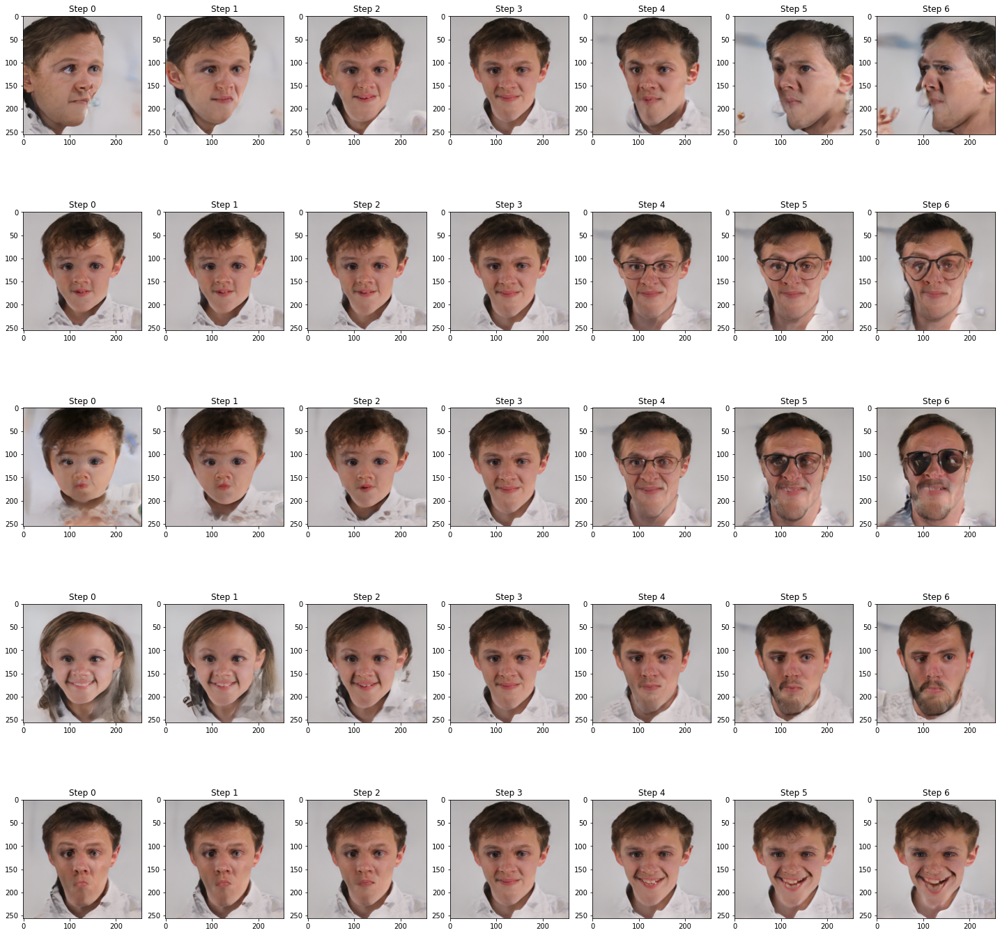

In [ ]:
output_images_array=np.stack(output_images_list,axis=0)

n=output_images_array.shape[0]
p=output_images_array.shape[1]

fig,ax=plt.subplots(n,p,figsize=(25,25))

for i in range(n) :
  for j in range(p) :
    ax[i,j].imshow(output_images_array[i,j])
    ax[i,j].set_title('Step {}'.format(j))

plt.show()

#### 3.2 Analyse en Composantes Principales (PCA)

Les résultats obtenus par InterFaceGAN sont très bons, mais ceux-ci nécessitent l'annotation d'un dataset. La question dès lors est: peut-on reproduire ces résultats sans supervisation ?

L'idée de la méthode est la suivante : les directions de principales variances devrait être liées à des attributs spécifiques (des visages dans notre cas, e.g. le genre, l'âge, la pose de la personne). En effectuant une Analyse en Composantes Principales, on devrait obtenir une bonne approximation des hyperplans correspondant à chaque attributs. À noter que de cette manière, nous n'avons pas de garantie sur les attributs qui seront identifiés au préalable, mais nous ne nous limitons pas de même à un nombre fixe d'attributs identifiables.

La réalisation pratique de cette méthode est la suivante :

*   Sampling de $N$ vecteurs aléatoires $z_i \in \mathcal{Z}$, les transposer dans l'espace $\mathcal{W}$ et effectuer une PCA sur ces $N$ vecteurs $w_i$.

*   Obtention d'une matrice $Z$ des $p$ composantes principales obtenues. Puis pour une image donnée associée à un vecteur $w$, ajout d'un terme $Zx$ où $x$ est un vecteur dont les seules composantes non nulles sont celles selon laquelle on veut faire varier l'image selon les directions d'une ou plusieurs des $p$ composantes principales $$w_{\text{layer d'injection}}  += Zx$$

On peut ainsi identifier des composantes liés à certains attributs spécifiques (genre, âge, etc.).
On observe que certains attributs sont liés à une même composantes. Pour les délier, on peut injecter la modification $Zx$ dans seulement quelques layers de StyleGAN 2. Cela menant à un contrôle fin de ces attributs.

Nous avons d'abord tenté d'implémenter une approche par PCA avec le même modèle pré-entraîné de StyleGAN 1 utilisé dans la partie précédente sur l'inversion d'une image réelle. Cependant ce modèle utilisé nous donne uniquement accès à l'espace $\mathcal{W}+$, car utiliser cet espace est plus intéressant dans le contexte d'une inversion d'image réelle car le gap vis-à-vis de la taille à l'image réelle est plus faible. Nous avons donc réalisé la PCA sur cet espace $\mathcal{W}+$ et nous observons que la manipulation des attributs bien qu'existante n'est pas aussi bonne que l'on pourrait s'y attendre. Nous avons donc implémenter cette approche en utilisant un modèle pré-entraîné de StyleGAN 2 nous donnant accès à l'espace latent $\mathcal{W}+$. Les résultats obtenus ont été bien meilleurs et comparables aux résultats obtenus par SVM avec l'approche d'InterFaceGAN.

Le tableau suivant résume les attributs que nous avons identifiés comme facilement manipulables pour StyleGAN 2 ainsi que les composantes auxquels ils sont liés et les layer sur lesquels ils agissent.

```
Attributs      | Composante | Layer d'injection
-----------------------------------------------
Genre          |      0     |        4-6
-----------------------------------------------
Age            |      3     |        3-7
-----------------------------------------------
Pose           |      1     |        0-2
-----------------------------------------------
Lunettes       |      3     |        1,2
-----------------------------------------------
Cheveux blancs |      16    |        7-9
-----------------------------------------------
Luminosité     |      2     |       10-17
```

##### Expériences avec StyleGAN 1

In [ ]:
#@title Fonctions utiles

def generate_pca_256(N_sample = int(1e5), N_dim = 100):

    # Generating N samples

    X = []
    for _ in range(N_sample):
        z_samples=torch.normal(mean=0, std=torch.ones([1,512])).to(inverter.run_device)
        w_samples = inverter.G.net.mapping.norm(z_samples)

        for i in range(inverter.G.net.mapping.num_layers):
            w_samples = inverter.G.net.mapping.__getattr__(f'dense{i}')(w_samples)

        init_w= torch.tensor(_get_tensor_value(w_samples).reshape(1,14,512))
        w = init_w[0][0]
        X.append(w.cpu().numpy())

    # PCA
    pca = PCA(n_components=N_dim)
    pca.fit(X)
    V = pca.components_ # PCA matrix
    return V

def pca_analysis_256(V, w, n_image, n_dim_pca, sigma = 1.0):
    plt.figure()
    f, axarr = plt.subplots(1,n_image,dpi=180)
    for i in range(n_image):
        x = np.zeros(V.shape[0])
        x[n_dim_pca] = (i) * sigma
        w_prime = w + torch.from_numpy(np.tile(V.T@x, (14, 1)))
        w_prime = w_prime.float()
        before = inverter.G.net.synthesis(w_prime.to(inverter.run_device))
        img = inverter.G.postprocess(_get_tensor_value(before))[0]
        axarr[i].imshow(img)
        title = str(i) + ' sigma'
        axarr[i].title.set_text(title)
    subtitl = str(n_dim_pca) + 'th axis'
    f.suptitle(subtitl)
    plt.tight_layout()
    plt.subplots_adjust(top=1.6)

def pca_analysis_complex_256(V, w, n_image, n_dim_pca, sigma = 1.0):
    plt.figure()
    offset = int(n_image / 2)
    f, axarr = plt.subplots(len(n_dim_pca),n_image,figsize=(n_image,len(n_dim_pca)),dpi=200)
    for j in range(len(n_dim_pca)):
        for i in range(n_image):
            x = np.zeros(V.shape[0])
            x[n_dim_pca[j]] = (i - offset) * sigma
            w_prime = w + torch.from_numpy(np.tile(V.T@x, (14, 1)))
            w_prime = w_prime.float()
            before = inverter.G.net.synthesis(w_prime.to(inverter.run_device))
            img = inverter.G.postprocess(_get_tensor_value(before))[0]
            axarr[j][i].imshow(img)
            axarr[j][i].axis('off')
    for i in range(n_image):
        title = str(i - offset) + ' sigma'
        axarr[0][i].title.set_text(title)

In [ ]:
V_256 = generate_pca_256(N_sample = int(1e5), N_dim = 100)

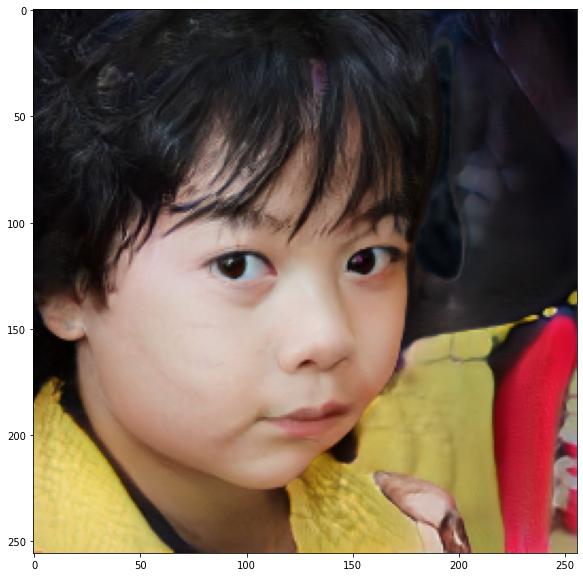

In [ ]:
z_samples=torch.normal(mean=0, std=torch.ones([1,512])).to(inverter.run_device)
w_samples = inverter.G.net.mapping.norm(z_samples)

for i in range(inverter.G.net.mapping.num_layers):
  w_samples = inverter.G.net.mapping.__getattr__(f'dense{i}')(w_samples)

init_w = torch.tensor(_get_tensor_value(w_samples).reshape(1,14,512))
#init_w = init_w[0][0].repeat(14, 1)
#init_w = init_w[None,:]

plt.figure(figsize=(10,10))

before = inverter.G.net.synthesis(init_w.to(inverter.run_device))
gen_image=inverter.G.postprocess(_get_tensor_value(before))[0]
plt.imshow(gen_image)

plt.show()

<Figure size 432x288 with 0 Axes>

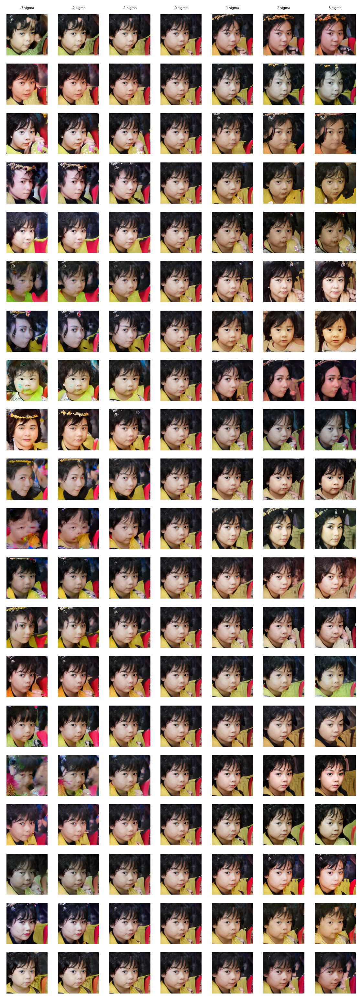

In [ ]:
pca_analysis_complex_256(V_256, init_w, n_image = 7, n_dim_pca = [x for x in range(20)], sigma = 2.0)

##### Expériences avec StyleGAN 2

In [ ]:
#@title Fonctions utiles

os.chdir('/content')
os.chdir(f'./{CODE_DIR2}')

plt.rcParams['font.size'] = '3'

# Reproducibility
torch.manual_seed(0)

def generate_pca(N_sample = int(1e5), N_dim = 100, model_pca = 'models/ffhq.pkl'):

    # Generating N samples
    with open(model_pca, 'rb') as f:
        G = pickle.load(f)['G_ema'].cuda() 
    c = None
    X = []
    for _ in range(N_sample):
        z = torch.randn([1, G.z_dim]).cuda()
        w = G.mapping(z, c, truncation_psi=0.5, truncation_cutoff=8)
        # On garde seulement la 1ère dimension de w car les 18 sont les mêmes
        X.append(w.cpu().numpy().squeeze()[0])

    # PCA
    pca = PCA(n_components=N_dim)
    pca.fit(X)
    V = pca.components_ # PCA matrix
    return V

def pca_analysis(V, w, n_image, n_dim_pca, sigma = 1.0):
    plt.figure()
    f, axarr = plt.subplots(1,n_image,dpi=180)
    for i in range(n_image):
        x = np.zeros(V.shape[0])
        x[n_dim_pca] = (i) * sigma
        w_prime = w + torch.from_numpy(np.tile(V.T@x, (18, 1))).to(torch.device('cuda:0'))
        img = G.synthesis(w_prime, noise_mode='const', force_fp32=True)
        img = img.cpu().permute(2, 3, 1, 0).squeeze()
        img = np.clip(img, 0, 1)
        axarr[i].imshow(img)
        title = str(i) + ' sigma'
        axarr[i].title.set_text(title)
    subtitl = str(n_dim_pca) + 'th axis'
    f.suptitle(subtitl)
    plt.tight_layout()
    plt.subplots_adjust(top=1.6)

def pca_analysis_complex(V, w, n_image, n_dim_pca, sigma = 1.0):
    plt.figure()
    offset = int(n_image / 2)
    f, axarr = plt.subplots(len(n_dim_pca),n_image,figsize=(n_image,len(n_dim_pca)),dpi=200)
    for j in range(len(n_dim_pca)):
        for i in range(n_image):
            x = np.zeros(V.shape[0])
            x[n_dim_pca[j]] = (i - offset) * sigma
            w_prime = w + torch.from_numpy(np.tile(V.T@x, (18, 1))).to(torch.device('cuda:0'))
            img = G.synthesis(w_prime, noise_mode='const', force_fp32=True)
            img = img.cpu().permute(2, 3, 1, 0).squeeze()
            img = np.clip(img, 0, 1)
            axarr[j][i].imshow(img)
            axarr[j][i].axis('off')
    for i in range(n_image):
        title = str(i - offset) + ' sigma'
        axarr[0][i].title.set_text(title)

def pca_analysis_layer(V, w, n_image, dim_pca, layers, sigma = 1.0):
    plt.figure()
    offset = int(n_image / 2)
    f, axarr = plt.subplots(1,n_image,figsize=(n_image,1),dpi=200)
    for i in range(n_image):
        x = np.zeros(V.shape[0])
        x[dim_pca] = (i - offset) * sigma
        added = torch.zeros(w.shape).to(torch.device('cuda:0'))
        for k in layers:
            added[0][k] += torch.from_numpy(V.T@x).to(torch.device('cuda:0'))
        w_prime = w + added
        img = G.synthesis(w_prime, noise_mode='const', force_fp32=True)
        img = img.cpu().permute(2, 3, 1, 0).squeeze()
        img = np.clip(img, 0, 1)
        axarr[i].imshow(img)
        axarr[i].axis('off')
        title = str(i - offset) + ' sigma'
        axarr[i].title.set_text(title)

V = generate_pca(N_sample = int(1e5), N_dim = 100, model_pca = 'models/ffhq.pkl')
os.chdir('/content')

(-0.5, 1023.5, 1023.5, -0.5)

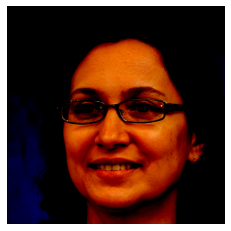

In [ ]:
os.chdir('/content')
os.chdir(f'./{CODE_DIR2}')

with open('models/ffhq.pkl', 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda() 
c = None
z = torch.randn([1, G.z_dim]).cuda()
w = G.mapping(z, c, truncation_psi=0.5, truncation_cutoff=8)
img = G.synthesis(w, noise_mode='const', force_fp32=True)
plt.imshow(np.clip(img.cpu().permute(2, 3, 1, 0).squeeze(),0,1))
plt.axis('off')

<Figure size 432x288 with 0 Axes>

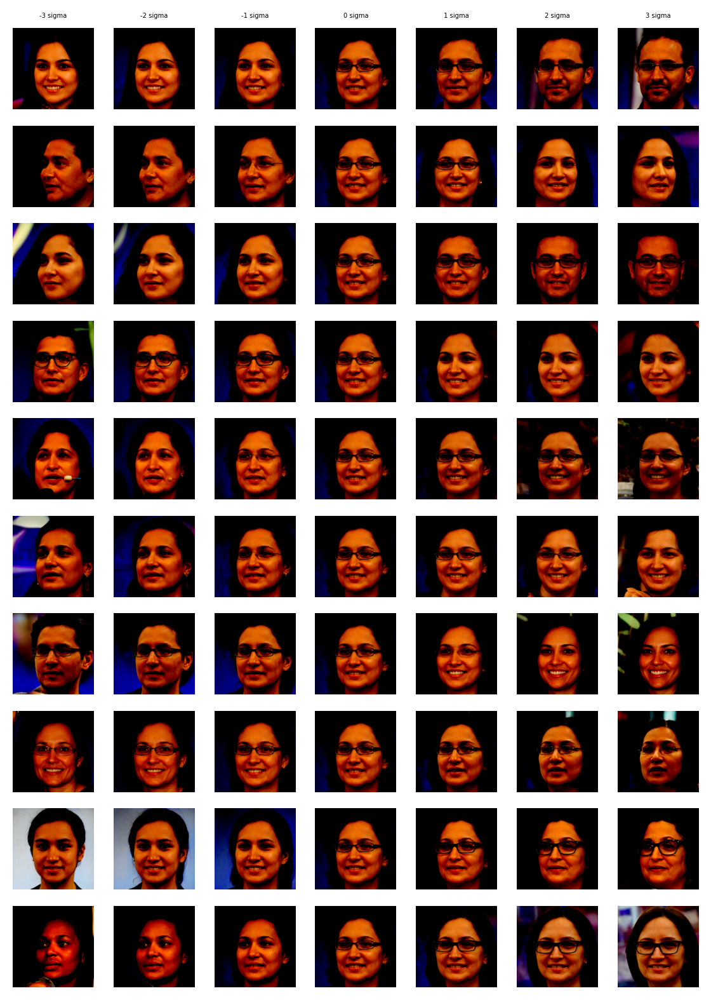

In [ ]:
pca_analysis_complex(V, w, n_image = 7, n_dim_pca = [x for x in range(10)], sigma = 1.5)

Modification d'attributs spécifiques :

Modification du genre:


<Figure size 432x288 with 0 Axes>

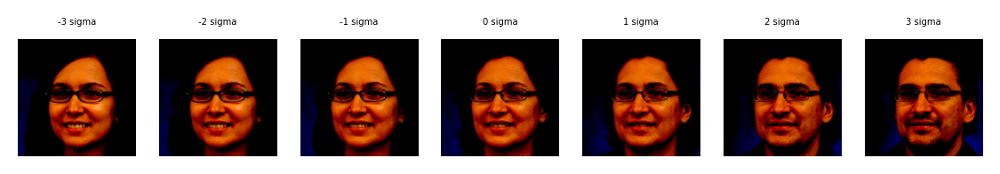

In [ ]:
print('Modification du genre:')
pca_analysis_layer(V, w, n_image = 7, dim_pca = 0, layers = [4,5,6], sigma = 1.5)

Modification de l'âge:


<Figure size 432x288 with 0 Axes>

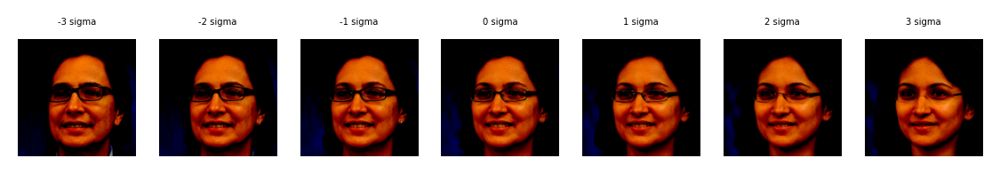

In [ ]:
#@title
print("Modification de l'âge:")
pca_analysis_layer(V, w, n_image = 7, dim_pca = 3, layers = [3,4,5,6,7], sigma = 1.5)


Modification de la pose:


<Figure size 432x288 with 0 Axes>

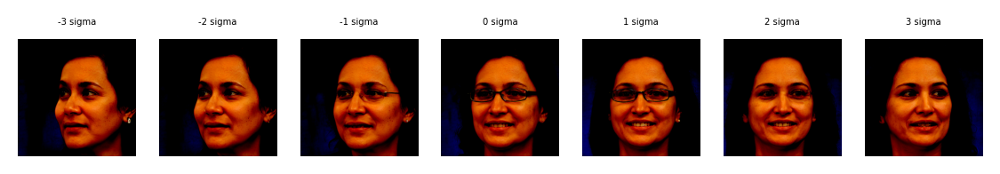

In [ ]:
#@title
print('Modification de la pose:')
pca_analysis_layer(V, w, n_image = 7, dim_pca = 1, layers = [0,1,2], sigma = 1.5)

Ajout / retrait de lunettes:


<Figure size 432x288 with 0 Axes>

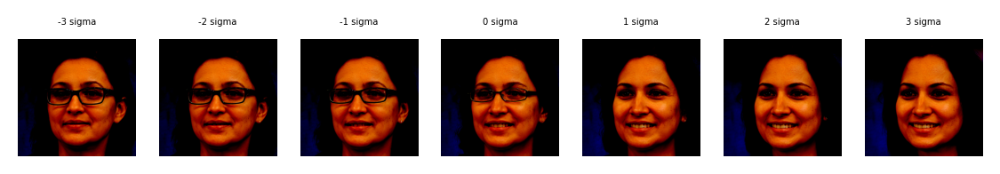

In [ ]:
#@title
print('Ajout / retrait de lunettes:')
pca_analysis_layer(V, w, n_image = 7, dim_pca = 3, layers = [1,2], sigma = 1.5)

Modification de la couleur de cheveux:


<Figure size 432x288 with 0 Axes>

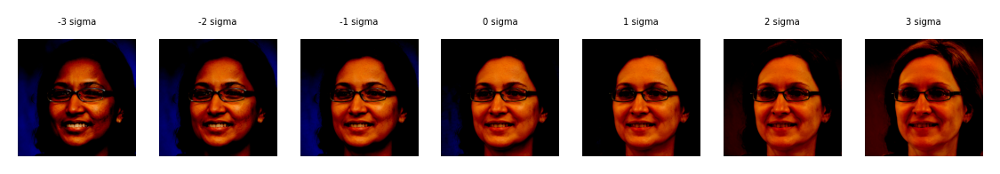

In [ ]:
#@title
print('Modification de la couleur de cheveux:')
pca_analysis_layer(V, w, n_image = 7, dim_pca = 16, layers = [7,8,9], sigma = 1.5)

Modification de la luminosité:


<Figure size 432x288 with 0 Axes>

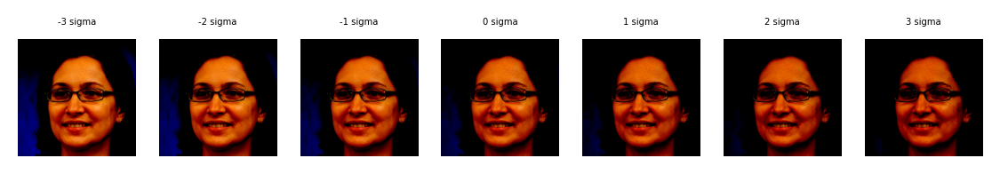

In [ ]:
#@title
print('Modification de la luminosité:')
pca_analysis_layer(V, w, n_image = 7, dim_pca = 2, layers = [10,11,12,13,14,15,16,17], sigma = 1.5)
os.chdir('/content')

# Conclusion : Exemple d'une pipeline complète

Cette étude de l'interprétation des StyleGANs a été réalisée en plusieurs étapes. Tout d'abord, un état de l'art sur les méthodes d'inversion du générateur des GANs a été réalisée. La méthode "hybride" *In-Domain GAN Inversion* a été étudiée, en particulier la sensibilité à l'initialisation du code latent dans $\mathcal{W}^{+}$. Le choix de $\mathcal{W}^{+}$ comme espace d'inversion a été motivé par la qualité de l'encodage pouvant être réalisé : un encodage $\mathbb{R}^{256 \times 256} \rightarrow \mathbb{R}^{14 \times 256}$ étant moins exigeant qu'un encodage $\mathbb{R}^{256 \times 256} \rightarrow \mathbb{R}^{256}$ .
Enfin, cette inversion nous a permis d'agir sur l'image via la manipulation d'attributs, ces frontières étant précalculées dans InterfaceGAN. Par la suite, il a été choisi de mener une étude sur le calcul de frontières, en utilisant une PCA au lieu des SVMs utilisés dans interface GAN afin de s'affranchir des contraintes d'annotations des données inhérentes aux SVMs. L'inversion, réalisée dans $\mathcal{W}^{+}$ et non $\mathcal{W}$ a rendu la réalisation de la PCA plus délicate, et les frontières des attributs moins parlantes d'un point de vue sémantiques par rapport à celles obtenues dans $\mathcal{W}$.

Nous concluons en proposant d'une pipeline permettant d'inverser une image réelle, et d'agir sur un de ces attributs par PCA. 

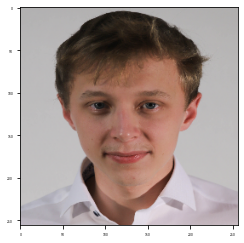

In [ ]:
#@title Image originale :

image=np.array(Image.open('/content/idinvert_pytorch/test_images/Victor.png'))[:,:,0:3]
image_resized = cv2.resize(image, (256, 256)) #On reshape l'image pour s'adapter à l'architecture utilisée. 
plt.imshow(image_resized)

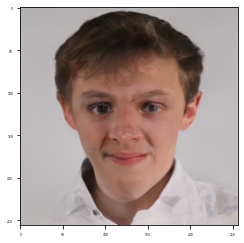

In [ ]:
#@title Image inversée :

latent_codes = np.load('/content/idinvert_pytorch/results/inversion/test/inverted_codes.npy')
w_l = torch.from_numpy(latent_codes)
before = inverter.G.net.synthesis(w_l.to(inverter.run_device))
img = inverter.G.postprocess(_get_tensor_value(before))[0]
plt.imshow(img)

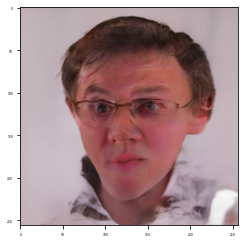

In [ ]:
#@title Image modifiée par PCA :

x = np.zeros(V_256.shape[0])
x[0] = 5
w_prime = w_l + torch.from_numpy(np.tile(V_256.T@x, (14, 1)))
w_pca = w_prime.float()
before = inverter.G.net.synthesis(w_pca.to(inverter.run_device))
img = inverter.G.postprocess(_get_tensor_value(before))[0]
plt.imshow(img)